In [37]:
import os
import re
from typing import List

import faiss
import matplotlib.pyplot as plt
import numpy as np
import optuna
import pandas as pd
import polars as pl
import requests
import torch
from annoy import AnnoyIndex
from numpy.typing import NDArray
from PIL import Image, UnidentifiedImageError
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import normalize
from tqdm import tqdm
from transformers import BertModel, BertTokenizerFast

tqdm.pandas()
os.environ["TOKENIZERS_PARALLELISM"] = "false"

In [38]:
DATASET_PATH = "data/imdb_movies.parquet"
DATASET_WITH_EMBEDDINGS_PATH = "data/imdb_movies_embeddings.parquet"
SUBMISSION_PATH = "data/submission.parquet"
RELEVANT_TITLES_PATH = "data/relevant_titles_subsample.parquet"
FEATURES_PATH = "data/features.npy"
OPTUNADB = "data/db.sqlite3_simple_recsys"

In [39]:
def clean_text(text: str) -> str:
    """
    Cleans the input text by removing special characters, excess whitespace,
    newlines, and tabs, and converting to lowercase.

    Parameters
    ----------
    text : str
        The input text to be cleaned.

    Returns
    -------
    str
        The cleaned text without special characters and extra whitespace.
    """
    # Replace special characters with a space
    cleaned_text = re.sub(r"[^a-zA-Z0-9\s]", "", text)

    # Remove multiple spaces, newlines, and tabs
    cleaned_text = re.sub(r"\s+", " ", cleaned_text)

    # Convert to lowercase and strip leading/trailing whitespace
    cleaned_text = cleaned_text.lower().strip()

    return cleaned_text


def preprocessing(df: pd.DataFrame, column_name: str) -> pd.Series:
    """
    Cleans a specified column in the DataFrame by removing special characters,
    extra whitespace, newlines, and tabs.

    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the text data.
    column_name : str
        The column name containing text to be cleaned.

    Returns
    -------
    pd.Series
        A cleaned column of the DataFrame.
    """
    # Apply the clean_text function to each element in the specified column
    return df[column_name].apply(lambda x: clean_text(x) if isinstance(x, str) else x)


def keywords_preprocessing(df: pd.DataFrame, column_name: str) -> pd.Series:
    """
    Cleans a specified column in the DataFrame by removing special characters,
    extra whitespace, newlines, and tabs.

    Parameters
    ----------
    df : pd.DataFrame
        The DataFrame containing the text data.
    column_name : str
        The column name containing text to be cleaned.

    Returns
    -------
    pd.Series
        A cleaned column of the DataFrame.
    """
    return df[column_name].apply(
        lambda x: " ".join(
            [clean_text(kw) for kw in x] if isinstance(x, np.ndarray) else x
        )
    )


def get_neighbors_by_title_id(index_row, title_ids) -> NDArray[int]:
    """
    Returns a list of title_id of the nearest neighbors for a given index.

    Parameters
    ----------
    index_row : list of int
        A list of indices representing the nearest neighbors.
    title_ids : np.ndarray
        An array of title_id values for all movies.

    Returns
    -------
    NDArray[int]
        A list of title_id values for the nearest neighbors.
    """

    return title_ids[index_row]


def get_embedding(
    text: str, tokenizer: BertTokenizerFast, model: BertModel
) -> NDArray[np.float32]:
    """
    Extracts the embeddings for the input text using the pre-trained BERT model.

    Parameters
    ----------
    text : str
        The input text to be converted to embeddings.
    tokenizer : BertTokenizerFast
        Tokenizer to convert text into tokens.
    model : BertModel
        Pre-trained model to generate embeddings.

    Returns
    -------
    NDArray[np.float32]
        The embeddings for the input text.
    """

    text = text if text is not None else ""

    # Tokenize the input text
    inputs = tokenizer(
        text,
        return_tensors="pt",
        padding=True,
        truncation=True,
        add_special_tokens=True,
        max_length=512,
    )

    # Generate the embeddings
    with torch.no_grad():
        outputs = model(**inputs)

        # Extract hidden states (assuming the model has output_hidden_states=True)
        hidden_states = outputs.hidden_states

    # Take the second-to-last hidden layer
    token_vecs = hidden_states[-2][0]  # Shape: [sequence_length, hidden_size]

    # Calculate the mean of all token vectors (sentence embedding)
    sentence_embedding = torch.mean(token_vecs, dim=0)

    return normalize(
        sentence_embedding.cpu().detach().numpy().reshape(1, -1), norm="l2", axis=1
    ).reshape(-1)


def hitrate(y_relevant: List[str], y_preds: list[str], k: int = 10) -> int:
    return int(len(set(y_relevant).intersection(y_preds[:k])) > 0)


def get_score(TOP_K: int = 10):
    hitrate_list = []
    user_preds = {
        title_id: recs for title_id, recs in pl.read_parquet(SUBMISSION_PATH).rows()
    }
    for title_id, relevant_items in pl.read_parquet(RELEVANT_TITLES_PATH).rows():
        recommended_titles = user_preds.get(title_id, [])[:TOP_K]
        hitrate_list.append(hitrate(relevant_items, recommended_titles, k=TOP_K))

    mean_hitrate = float(np.mean(hitrate_list))
    return mean_hitrate


def find_neighbors_for_all_vectors(vectors, annoy_index, n_neighbors):
    """
    Finds nearest neighbors for all vectors in the array.

    Parameters
    ----------
    vectors : np.ndarray
        Array of vectors for which to find nearest neighbors.
    annoy_index : AnnoyIndex
        The built Annoy index.
    n_neighbors : int
        Number of nearest neighbors to find.

    Returns
    -------
    list
        List of lists with indices of nearest neighbors for each vector.
    """
    neighbors_list = []

    for vector in tqdm(vectors):
        neighbors = annoy_index.get_nns_by_vector(
            vector, n_neighbors, include_distances=False
        )
        neighbors_list.append(neighbors)

    return np.array(neighbors_list)[:, 1:]


def merge_arrays(row: pd.Series) -> np.ndarray:
    """Merge arrays from the given columns, ignoring NaN values.

    Parameters
    ----------
    row : pd.Series
        A row from the DataFrame containing ndarrays in specific columns.

    Returns
    -------
    np.ndarray
        A single merged array of all strings from non-NaN columns.
    """
    # Collect all ndarrays, ignoring NaN values
    arrays = [x for x in row if isinstance(x, np.ndarray)]

    # If there are any arrays, concatenate them into one array
    if arrays:
        return np.concatenate(arrays)
    else:
        # Return an empty array if there are no arrays in the row
        return np.array([])

In [40]:
movies_df = pd.read_parquet(DATASET_PATH)

movies_df.head()

,title_id,poster_url,type,name,original_name,description,genre,date,rating_count,rating_value,keywords,featured_review,stars,directors,creators
0,tt0111161,https://m.media-amazon.com/images/M/MV5BNDE3OD...,Movie,Побег из Шоушенка,The Shawshank Redemption,"Over the course of several years, two convicts...",[Drama],1994-10-14,2755277.0,9.3,"[prison, based on the works of stephen king, e...",It is no wonder that the film has such a high ...,"[Tim Robbins, Morgan Freeman, Bob Gunton]",[Frank Darabont],"[Stephen King, Frank Darabont]"
1,tt0068646,https://m.media-amazon.com/images/M/MV5BM2MyNj...,Movie,Крестный отец,The Godfather,"Don Vito Corleone, head of a mafia family, dec...","[Crime, Drama]",1972-03-24,1917037.0,9.2,"[mafia, patriarch, crime family, organized cri...",I love this movie and all of the GF movies. I ...,"[Marlon Brando, Al Pacino, James Caan]",[Francis Ford Coppola],"[Mario Puzo, Francis Ford Coppola]"
2,tt0468569,https://m.media-amazon.com/images/M/MV5BMTMxNT...,Movie,Тёмный рыцарь,The Dark Knight,When the menace known as the Joker wreaks havo...,"[Action, Crime, Drama]",2008-08-14,2728169.0,9.0,"[dc comics, psychopath, moral dilemma, superhe...","If someone else acted as Joker, I would give t...","[Christian Bale, Heath Ledger, Aaron Eckhart]",[Christopher Nolan],"[Jonathan Nolan, Christopher Nolan, David S. G..."
3,tt0050083,https://m.media-amazon.com/images/M/MV5BMWU4N2...,Movie,12 разгневанных мужчин,12 Angry Men,The jury in a New York City murder trial is fr...,"[Crime, Drama]",1961-11-13,816234.0,9.0,"[jury, dialogue driven, courtroom, trial, jury...",&apos;12 Angry Men&apos; is an outstanding fil...,"[Henry Fonda, Lee J. Cobb, Martin Balsam]",[Sidney Lumet],[Reginald Rose]
4,tt0071562,https://m.media-amazon.com/images/M/MV5BMWMwMG...,Movie,Крестный отец 2,The Godfather Part II,The early life and career of Vito Corleone in ...,"[Crime, Drama]",1974-12-18,1305122.0,9.0,"[revenge, 1950s, corrupt politician, cuban rev...",The original Godfather is a brilliant work. It...,"[Al Pacino, Robert De Niro, Robert Duvall]",[Francis Ford Coppola],"[Francis Ford Coppola, Mario Puzo]"


In [41]:
movies_df["description"] = preprocessing(movies_df, "description")
movies_df["featured_review"] = preprocessing(movies_df, "featured_review")

In [42]:
features_to_concat = ["keywords", "genre", "stars", "directors", "creators"]
movies_df["combined_feature"] = movies_df[features_to_concat].apply(
    merge_arrays, axis=1
)
movies_df["combined_feature"] = keywords_preprocessing(movies_df, "combined_feature")

In [43]:
# Load the pre-trained BERT fast tokenizer
tokenizer = BertTokenizerFast.from_pretrained(
    "bert-base-uncased", clean_up_tokenization_spaces=True
)

# Load the pre-trained BERT model with the hidden states output
model = BertModel.from_pretrained("bert-base-uncased", output_hidden_states=True)

# Put the model in "evaluation" mode, meaning feed-forward operation.
model.eval()

BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0): BertLayer(
        (attention): BertAttention(
          (self): BertSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False)
          

In [44]:
# Initialize TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Fit the vectorizer on the cleaned text data
tfidf_features = vectorizer.fit_transform(movies_df["combined_feature"])

In [45]:
text = movies_df["description"][0]
text

'over the course of several years two convicts form a friendship seeking consolation and eventually redemption through basic compassion'

In [46]:
test_embedding = get_embedding(text, tokenizer, model)
test_embedding

array([-1.33654964e-03,  5.03364317e-02,  1.02817491e-02, -1.95518211e-02,
        3.91735919e-02,  1.29627725e-02,  3.73589247e-02,  1.23640411e-02,
        2.43917648e-02, -3.99483070e-02,  2.84238607e-02, -1.10835163e-02,
        2.56795585e-02,  3.52511480e-02,  1.76502261e-02,  4.57443930e-02,
        1.51087902e-02, -5.56203886e-04,  1.17077054e-02,  3.97092663e-02,
       -3.45717091e-03, -6.34468161e-03, -4.34431657e-02,  3.92220356e-02,
        3.39607336e-02,  2.08944511e-02,  1.24703962e-02, -2.04799119e-02,
       -3.24436501e-02,  4.32891734e-02,  3.69914249e-02, -9.48282250e-04,
        2.52576778e-03, -2.28051413e-02, -3.05191055e-02,  2.99215950e-02,
        7.94915110e-03,  2.84288134e-02,  1.59844495e-02,  3.98187106e-03,
        4.14466821e-02, -6.49416866e-03,  1.15928808e-02, -1.64190400e-02,
        3.10460739e-02, -4.34526317e-02,  1.72574241e-02, -4.20505702e-02,
       -2.61011384e-02, -1.71221774e-02, -4.34211195e-02, -1.04360273e-02,
        3.47960219e-02, -

In [47]:
test_embedding.shape

(768,)

In [48]:
if os.path.exists(FEATURES_PATH):
    with open(FEATURES_PATH, "rb") as f:
        features_mat = np.load(f)
else:
    movies_df["description_embeddings"] = movies_df["description"].progress_apply(
        lambda text: get_embedding(text, tokenizer, model)
    )
    movies_df["featured_review_embeddings"] = movies_df[
        "featured_review"
    ].progress_apply(lambda text: get_embedding(text, tokenizer, model))
    description_embeddings = np.vstack(movies_df["description_embeddings"].values)
    featured_review_embeddings = np.vstack(
        movies_df["featured_review_embeddings"].values
    )
    features_mat = np.concatenate(
        [description_embeddings, featured_review_embeddings],
        axis=1,
    )
    with open(FEATURES_PATH, "wb") as f:
        np.save(f, features_mat, allow_pickle=True)

In [49]:
n_tfidf_features = len(vectorizer.get_feature_names_out())
n_tfidf_features

30868

In [50]:
def objective(trial):
    # Generate ngram_range with the condition n_min <= n_max
    n_min = trial.suggest_int("n_min", 1, 10)
    n_max = trial.suggest_int("n_max", n_min, 10)  # n_max is at least n_min and up to 10

    tfidf_params = {
        "max_features": trial.suggest_int("max_features", 100, n_tfidf_features),
        "ngram_range": (n_min, n_max),  # Set ngram_range using n_min and n_max
        "sublinear_tf": trial.suggest_categorical("sublinear_tf", [True, False]),
        "max_df": trial.suggest_float("max_df", 0.9, 1),  # max_df to filter terms appearing in more than 95% of documents
        # "min_df": trial.suggest_float("min_df", 0.01, 0.05),  # min_df to filter terms appearing in less than 5% of documents
        "stop_words": trial.suggest_categorical("stop_words", ["english", None]),
    }

    # Initialize TF-IDF vectorizer
    vectorizer = TfidfVectorizer(**tfidf_params)

    # Fit the vectorizer on the cleaned text data
    tfidf_features = vectorizer.fit_transform(movies_df["combined_feature"])

    # Add the TF-IDF embeddings to the features matrix
    optuna_features_mat = np.concatenate(
        [features_mat, tfidf_features.toarray()], axis=1
    )

    # Ensure features_mat is a numpy array of dtype float32
    optuna_features_mat = np.asarray(optuna_features_mat, dtype=np.float32)

    # Set hyperparameters for Faiss index
    n_neighbors = 10
    d = optuna_features_mat.shape[1]
    k = n_neighbors + 1

    # Normalize features with faiss.normalize_L2
    faiss.normalize_L2(optuna_features_mat)

    # Create the FAISS index for inner product search (cosine similarity after normalization)
    index = faiss.IndexFlatL2(d)

    # Add the normalized features to the index
    index.add(optuna_features_mat)

    # Perform a search for the nearest neighbors
    D, I = index.search(optuna_features_mat, k)
    D, I = D[:, 1:], I[:, 1:]

    # Add a new column with title_ids of the nearest neighbors
    movies_df["recs"] = I.tolist()
    movies_df["recs"] = movies_df["recs"].progress_apply(
        lambda recs: get_neighbors_by_title_id(recs, movies_df["title_id"].values)
    )

    # Create a DataFrame with title_id and recommendations
    recs_df = movies_df[["title_id", "recs"]]
    recs_df.to_parquet(SUBMISSION_PATH)

    return get_score(TOP_K=10)


if os.path.exists(OPTUNADB):
    os.remove(OPTUNADB)

# Create a Study object and optimize the objective function
study = optuna.create_study(
    storage="sqlite:///" + OPTUNADB,  # Specify the storage URL here.
    study_name="simple_recsys",
    direction="maximize",
)

# Run the Optimization Process
study.optimize(objective, n_trials=50)

[I 2024-10-08 01:41:35,726] A new study created in RDB with name: simple_recsys
100%|██████████| 9798/9798 [00:00<00:00, 337096.66it/s]
[I 2024-10-08 01:41:40,210] Trial 0 finished with value: 0.138 and parameters: {'n_min': 6, 'n_max': 9, 'max_features': 17069, 'sublinear_tf': False, 'max_df': 0.9595617450071204, 'stop_words': None}. Best is trial 0 with value: 0.138.
100%|██████████| 9798/9798 [00:00<00:00, 350255.18it/s]
[I 2024-10-08 01:41:46,710] Trial 1 finished with value: 0.148 and parameters: {'n_min': 5, 'n_max': 9, 'max_features': 27693, 'sublinear_tf': True, 'max_df': 0.9868270934407124, 'stop_words': 'english'}. Best is trial 1 with value: 0.148.
100%|██████████| 9798/9798 [00:00<00:00, 351357.19it/s]
[I 2024-10-08 01:41:47,767] Trial 2 finished with value: 0.132 and parameters: {'n_min': 9, 'n_max': 9, 'max_features': 2486, 'sublinear_tf': False, 'max_df': 0.9951542027181557, 'stop_words': 'english'}. Best is trial 1 with value: 0.148.
100%|██████████| 9798/9798 [00:00<00

In [51]:
study.best_params

{'n_min': 1,
 'n_max': 1,
 'max_features': 12505,
 'sublinear_tf': True,
 'max_df': 0.9232261777859587,
 'stop_words': None}

In [52]:
best_params = study.best_params
best_params["ngram_range"] = (best_params.pop("n_min"), best_params.pop("n_max"))
best_params

{'max_features': 12505,
 'sublinear_tf': True,
 'max_df': 0.9232261777859587,
 'stop_words': None,
 'ngram_range': (1, 1)}

In [54]:
# Initialize TF-IDF vectorizer with the best hyperparameters
vectorizer = TfidfVectorizer(**best_params)
tfidf_features = vectorizer.fit_transform(movies_df["combined_feature"])

In [55]:
# Add the TF-IDF embeddings to the features matrix
final_features = np.concatenate([features_mat, tfidf_features.toarray()], axis=1)

In [56]:
final_features.shape

(9798, 14041)

In [57]:
# Set hyperparameters for Faiss index
n_neighbors = 10
d = final_features.shape[1]
print(f"Number of features: {d}")
k = n_neighbors + 1

# Ensure features_mat is a numpy array of dtype float32
final_features = np.asarray(final_features, dtype=np.float32)

# Normalize features with faiss.normalize_L2
faiss.normalize_L2(final_features)

# Create the FAISS index for inner product search (cosine similarity after normalization)
index = faiss.IndexFlatL2(d)

# Add the normalized features to the index
index.add(final_features)

Number of features: 14041


In [58]:
# Perform a search for the nearest neighbors
D, I = index.search(final_features, k)
D, I = D[:, 1:], I[:, 1:]
D.shape, I.shape

((9798, 10), (9798, 10))

In [59]:
# Add a new column with title_ids of the nearest neighbors
movies_df["recs"] = I.tolist()
movies_df["recs"] = movies_df["recs"].progress_apply(
    lambda recs: get_neighbors_by_title_id(recs, movies_df["title_id"].values)
)

100%|██████████| 9798/9798 [00:00<00:00, 259789.18it/s]


In [60]:
movies_df.head()

,title_id,poster_url,type,name,original_name,description,genre,date,rating_count,rating_value,keywords,featured_review,stars,directors,creators,combined_feature,recs
0,tt0111161,https://m.media-amazon.com/images/M/MV5BNDE3OD...,Movie,Побег из Шоушенка,The Shawshank Redemption,over the course of several years two convicts ...,[Drama],1994-10-14,2755277.0,9.3,"[prison, based on the works of stephen king, e...",it is no wonder that the film has such a high ...,"[Tim Robbins, Morgan Freeman, Bob Gunton]",[Frank Darabont],"[Stephen King, Frank Darabont]",prison based on the works of stephen king esca...,"[tt0884328, tt0120689, tt0123964, tt5606664, t..."
1,tt0068646,https://m.media-amazon.com/images/M/MV5BM2MyNj...,Movie,Крестный отец,The Godfather,don vito corleone head of a mafia family decid...,"[Crime, Drama]",1972-03-24,1917037.0,9.2,"[mafia, patriarch, crime family, organized cri...",i love this movie and all of the gf movies i s...,"[Marlon Brando, Al Pacino, James Caan]",[Francis Ford Coppola],"[Mario Puzo, Francis Ford Coppola]",mafia patriarch crime family organized crime r...,"[tt0099674, tt0071562, tt0078788, tt0071360, t..."
2,tt0468569,https://m.media-amazon.com/images/M/MV5BMTMxNT...,Movie,Тёмный рыцарь,The Dark Knight,when the menace known as the joker wreaks havo...,"[Action, Crime, Drama]",2008-08-14,2728169.0,9.0,"[dc comics, psychopath, moral dilemma, superhe...",if someone else acted as joker i would give th...,"[Christian Bale, Heath Ledger, Aaron Eckhart]",[Christopher Nolan],"[Jonathan Nolan, Christopher Nolan, David S. G...",dc comics psychopath moral dilemma superhero c...,"[tt1345836, tt0372784, tt0482571, tt6723592, t..."
3,tt0050083,https://m.media-amazon.com/images/M/MV5BMWU4N2...,Movie,12 разгневанных мужчин,12 Angry Men,the jury in a new york city murder trial is fr...,"[Crime, Drama]",1961-11-13,816234.0,9.0,"[jury, dialogue driven, courtroom, trial, jury...",apos12 angry menapos is an outstanding film it...,"[Henry Fonda, Lee J. Cobb, Martin Balsam]",[Sidney Lumet],[Reginald Rose],jury dialogue driven courtroom trial jury room...,"[tt22074164, tt0042841, tt0052561, tt0051201, ..."
4,tt0071562,https://m.media-amazon.com/images/M/MV5BMWMwMG...,Movie,Крестный отец 2,The Godfather Part II,the early life and career of vito corleone in ...,"[Crime, Drama]",1974-12-18,1305122.0,9.0,"[revenge, 1950s, corrupt politician, cuban rev...",the original godfather is a brilliant work it ...,"[Al Pacino, Robert De Niro, Robert Duvall]",[Francis Ford Coppola],"[Francis Ford Coppola, Mario Puzo]",revenge 1950s corrupt politician cuban revolut...,"[tt0099674, tt0068646, tt0086216, tt0071360, t..."


In [61]:
recs_df = movies_df[["title_id", "recs"]]
recs_df.head()

,title_id,recs
0,tt0111161,"[tt0884328, tt0120689, tt0123964, tt5606664, t..."
1,tt0068646,"[tt0099674, tt0071562, tt0078788, tt0071360, t..."
2,tt0468569,"[tt1345836, tt0372784, tt0482571, tt6723592, t..."
3,tt0050083,"[tt22074164, tt0042841, tt0052561, tt0051201, ..."
4,tt0071562,"[tt0099674, tt0068646, tt0086216, tt0071360, t..."


In [62]:
recs_df.to_parquet(SUBMISSION_PATH)

In [63]:
TOP_K = 10
get_score(TOP_K)

0.244

In [64]:
relevant_titles_df = pd.read_parquet(RELEVANT_TITLES_PATH)

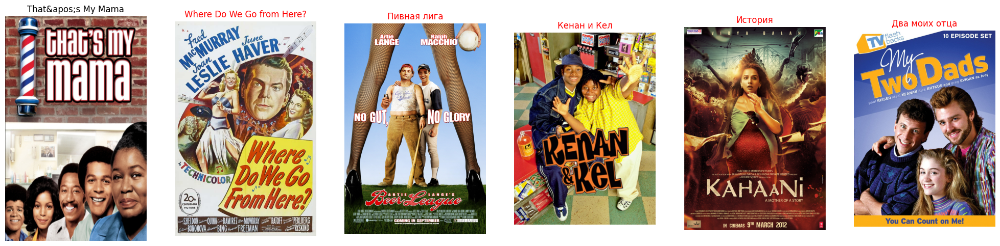

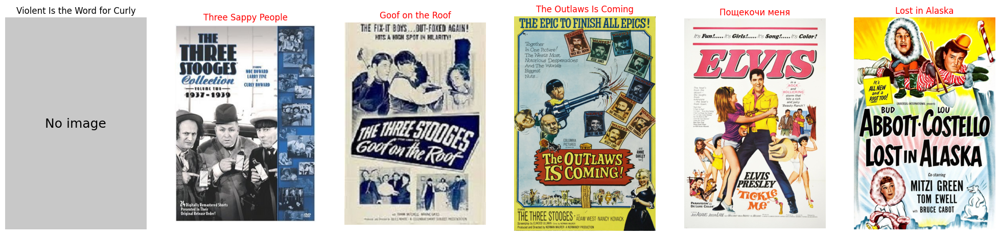

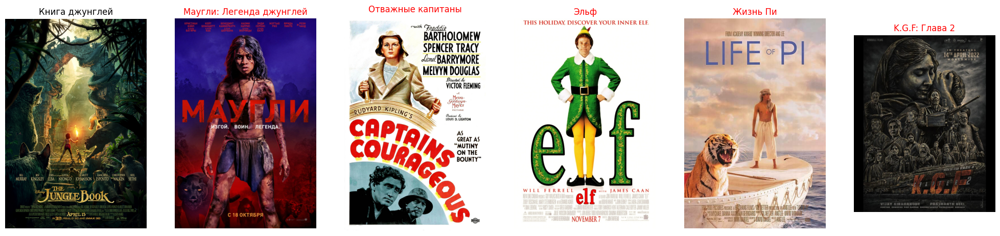

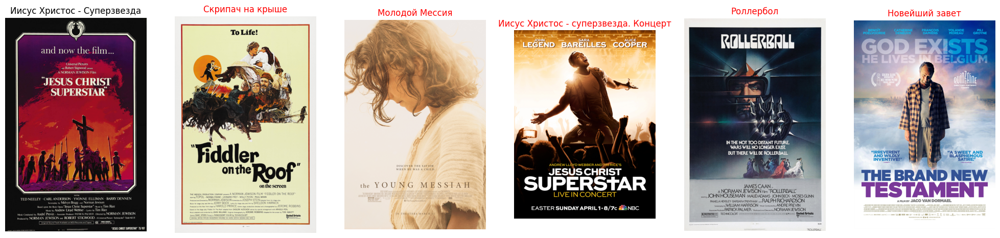

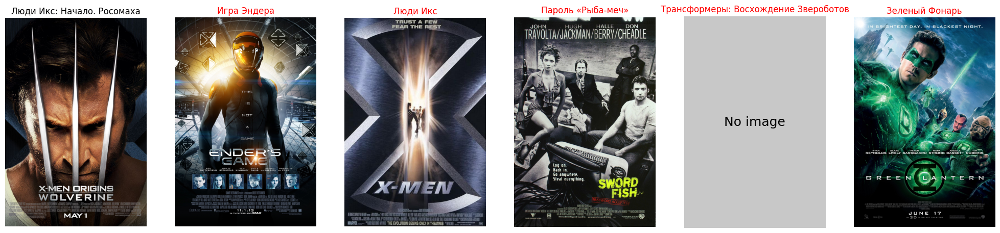

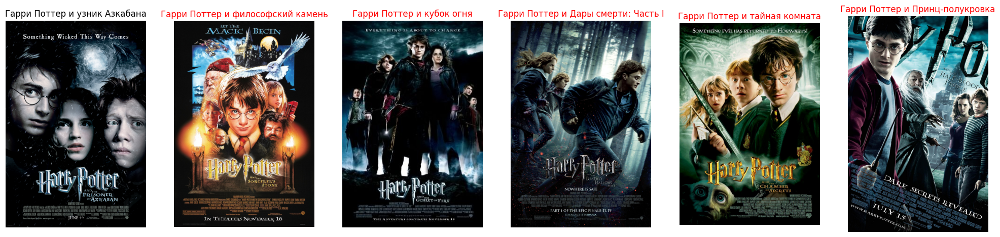

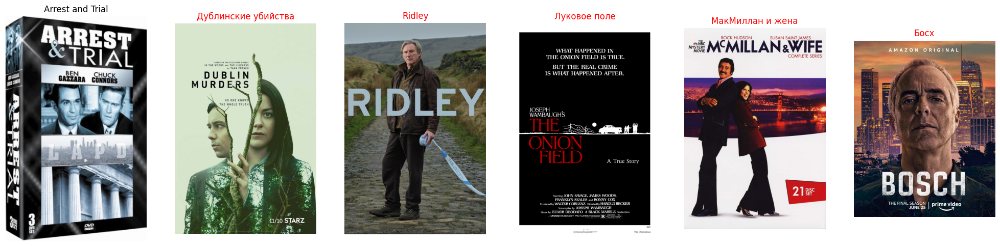

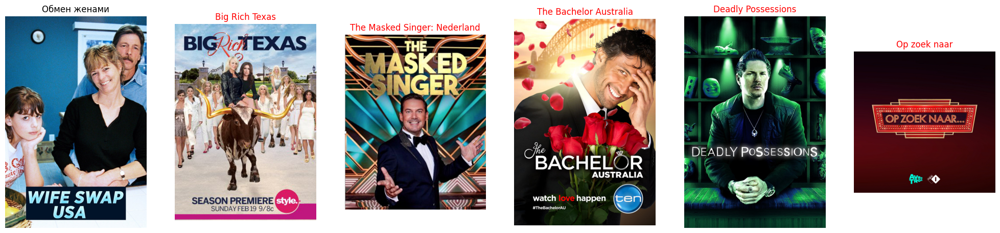

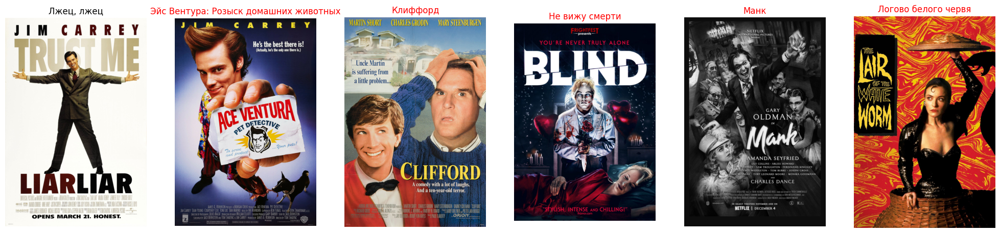

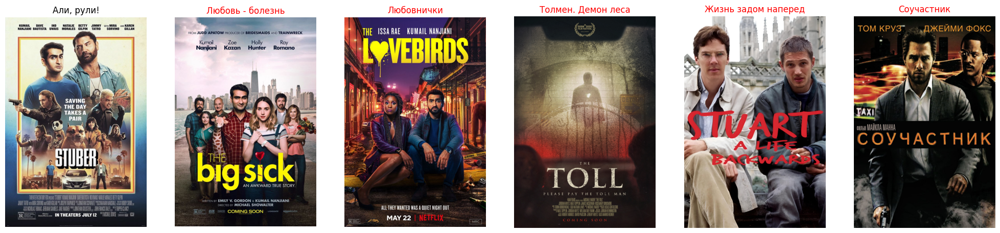

In [65]:
# Define the size of the "No image" placeholder
placeholder_size = (200, 300)  # Example size, adjust as needed

random_ids = np.random.randint(movies_df.shape[0], size=10)
random_movies = movies_df.loc[random_ids, "title_id"]

k = 5
for title_id in random_movies:
    fig, axs = plt.subplots(1, k + 1, figsize=(25, 10))

    # Find the index of the target movie
    title_ind = movies_df["title_id"].to_list().index(title_id)

    # Get the relevant titles for the target movie
    relevant_titles = (
        relevant_titles_df[relevant_titles_df["title_id"] == title_id][
            "relevant_titles"
        ]
        .explode()
        .tolist()
    )

    # Visualize the target movie
    url = movies_df.loc[title_ind, "poster_url"]
    try:
        im = Image.open(requests.get(url, stream=True).raw)
    except UnidentifiedImageError:
        im = None  # If the image is not found or can't be loaded

    if im:
        axs[0].imshow(im)
    else:
        # Create a "No image" placeholder with the same size as other images
        placeholder_img = Image.new("RGB", placeholder_size, (200, 200, 200))
        axs[0].imshow(placeholder_img)
        # Centrally align the "No image" text within the placeholder
        axs[0].text(
            0.5,
            0.5,
            "No image",
            fontsize=18,
            ha="center",
            va="center",
            color="black",
            transform=axs[
                0
            ].transAxes,  # Ensure the text is aligned relative to the axis
        )
    axs[0].axis("off")
    axs[0].set_title(movies_df["name"][title_ind])

    # Build the recommendations
    nearest_inds = I[title_ind][:k]
    recs_posters = movies_df.loc[nearest_inds, "poster_url"]
    recs_names = movies_df.loc[nearest_inds, "name"]
    recs_title_ids = movies_df.loc[nearest_inds, "title_id"].values

    # Visualize the recommendations
    for i, (url, name) in enumerate(zip(recs_posters, recs_names)):
        try:
            im = Image.open(requests.get(url, stream=True).raw)
        except UnidentifiedImageError:
            im = None  # If the image is not found or can't be loaded

        if im:
            axs[1 + i].imshow(im)
        else:
            # Use the same "No image" placeholder for missing images
            placeholder_img = Image.new("RGB", placeholder_size, (200, 200, 200))
            axs[1 + i].imshow(placeholder_img)
            axs[1 + i].text(
                0.5,
                0.5,
                "No image",
                fontsize=18,
                ha="center",
                va="center",
                color="black",
                transform=axs[
                    1 + i
                ].transAxes,  # Ensure the text is aligned relative to the axis
            )
        axs[1 + i].axis("off")
        axs[1 + i].set_title(
            name, color=("g" if recs_title_ids[i] in relevant_titles else "r")
        )

    plt.show()